In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


First we read the coded aperture images and display them.

(9L, 7L)


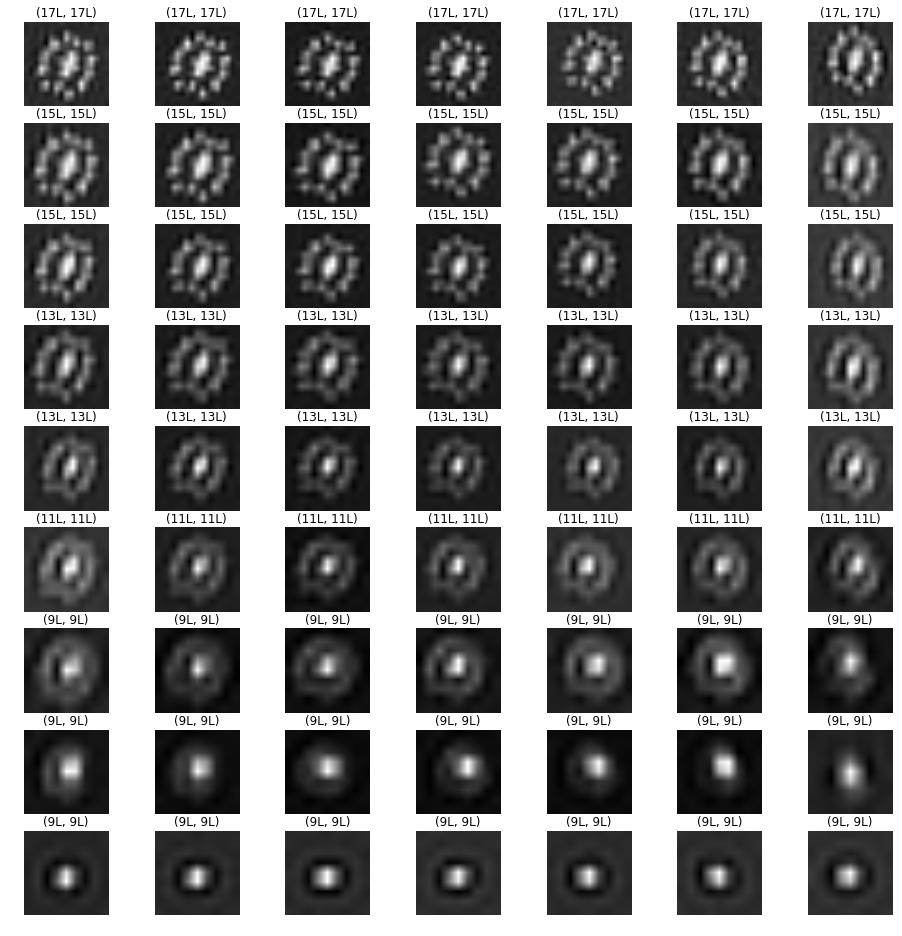

In [37]:
import scipy.io
import itertools

filters = array([scipy.io.loadmat("CodedApertureData/filts/filt_scl0" + str(i) + ".mat")["filts"] for i in range(1,10)]).squeeze()
print filters.shape

gray()
figure(figsize=(16,16))
for idx, (x, y) in enumerate(itertools.product(range(filters.shape[0]), range(filters.shape[1]))):
    subplot(filters.shape[0],filters.shape[1],idx+1)
    axis('off')
    title(filters[x][y].shape)
    imshow(filters[x][y])

(1171L, 1758L, 3L)


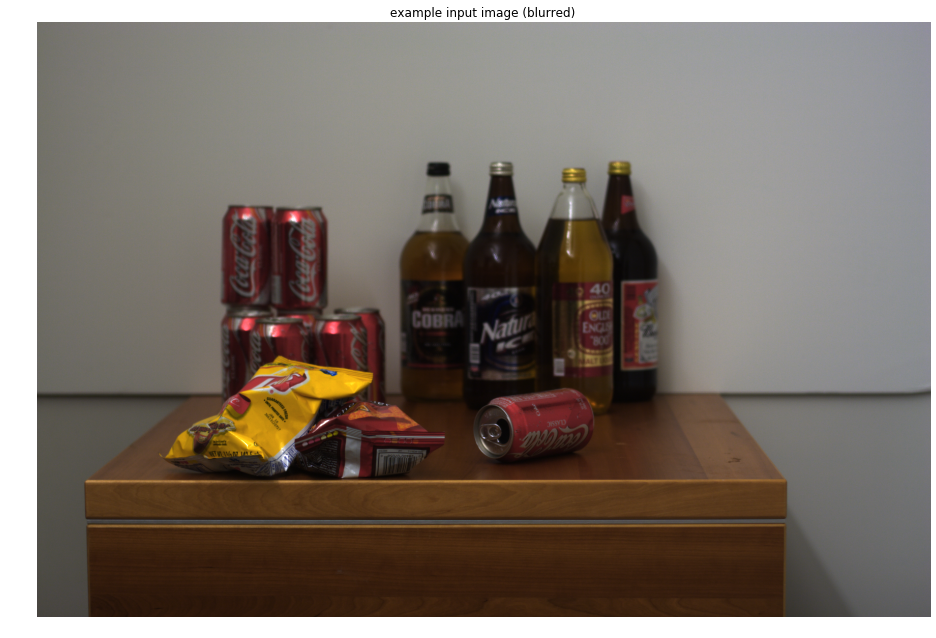

In [3]:
test_image = imread("CodedApertureData/beer_coke_inp.bmp")
figure(figsize=(16,16))
axis('off')
title("example input image (blurred)")
imshow(test_image)
print test_image.shape

Next we implement Deconvolution with Gaussian Prior in the frequency domain

In case of an RGB image we deconvolve each channel separately

In [4]:

def deconv_frequency(I, filt1, we):
    n, m = I.shape
    filt1 = fliplr(flipud(filt1))

    Gx=fft.fft2([[-1], [1]],[n,m])
    Gy=fft.fft2([[-1], [1]],[n,m])
    F = fft.fft2(filt1,[n,m])

    A = conj(F)*F + we*(conj(Gx)*conj(Gy)*Gy)
    b = conj(F)*fft.fft2(I)
    
    X = b / A
    x = fft.ifft2(X)
    
    hs1 = floor((n-1)/2)
    hs2 = floor((m-1)/2)
        
    return x

def deconv_frequency_rgb(I, filt, we):
    r = deconv_frequency(I[:,:,0], filt, we)
    g = deconv_frequency(I[:,:,1], filt, we)
    b = deconv_frequency(I[:,:,2], filt, we)
    return dstack((r.real,g.real,b.real))/256.0


We deconvolve the image with one of the filters

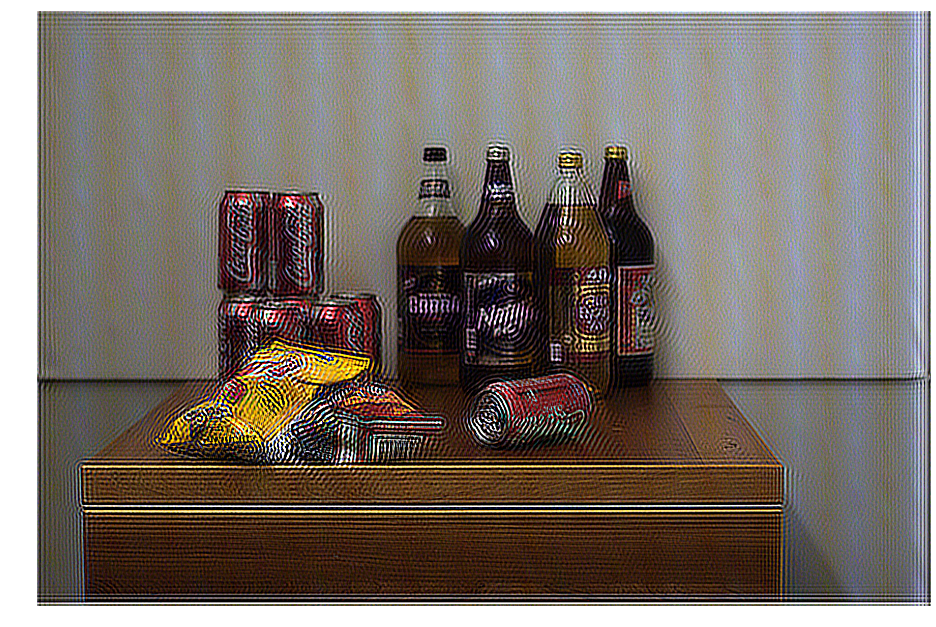

In [5]:
filter = filters[0][3]
deconvolved = deconv_frequency_rgb(test_image, filter, 0.01)

figure(figsize=(16,16))
axis('off')
imshow(clip(deconvolved,0,1))

However, we have multiple filters (7) per image, to be used at different image parts. We make it possible to use multiple filters by striping the image into 150 pixel-wide stripes.

We get around the border artifacts by adding a border to each stripe for the deconvolution, and discarding it afterwards.

In [6]:
image_parts = range(0,7)
image_parts[3] = (-75,75)
for i in range(0,3):
    image_parts[i] = (-75-150*(3-i), 75-150*(3-i))
    image_parts[4+i] = (-75+150*(i+1), 75+150*(i+1))
image_parts = array(image_parts)

def deconv_frequency_series(I, filters, we, image_parts):
    I = I.astype(float)
    _, xshape, _ = I.shape
    midx = xshape/2
    image_parts = image_parts + midx
    border = 20    
    image_parts[0][0] = border
    image_parts[-1][-1] = xshape-border
    image_parts = image_parts + [-border,border]
        
    deconvolved = zeros_like(I)
    
    for filter, image_part in zip(filters, image_parts):
        image_slice = I[:,image_part[0]:image_part[1]]
        deconvolved_slice = deconv_frequency_rgb(image_slice, filter, we)
        deconvolved[:,image_part[0]+border:image_part[1]-border] = deconvolved_slice[:,border:-border]
        
    return deconvolved

deconvolved = deconv_frequency_series(test_image, filters[0], 0.01, image_parts) 

Thus we obtain an deconvolved image composed of multiple slices

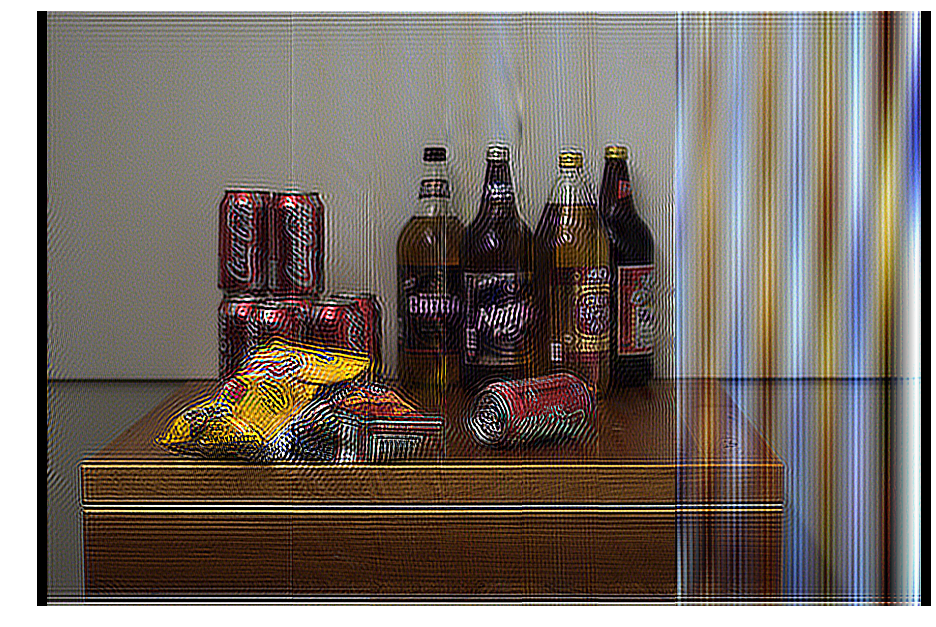

In [7]:
figure(figsize=(16,16))
axis('off')
imshow(clip(deconvolved,0,1))

Now we compute the deconvolution for each of the 9 filters from different depths.

In [17]:
print filters[:,3].shape

(9L,)


In [18]:
#deconvolved_images = p.map(deconv_frequency_series, [(test_image, filter, 0.01, image_parts) for filter in filters])
deconvolved_images = [deconv_frequency_rgb(test_image, filter, 0.01) for filter in filters[:,3]]

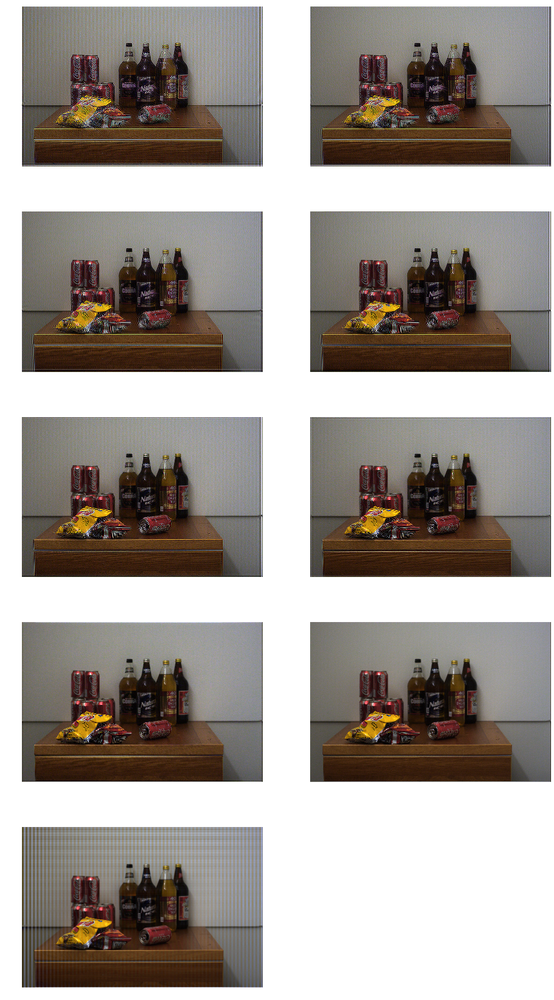

In [23]:
figure(figsize=(16,30))
for i, image in enumerate(deconvolved_images):
    subplot(5,2,i+1)
    axis('off')
    imshow(clip(image,0,1))

We compute errors for each of the deconvolved images

In [149]:
a = dstack((signal.convolve2d(deconvolved_images[0][:,:,0], filters[0,3], boundary='symm', mode='same'),
              signal.convolve2d(deconvolved_images[0][:,:,1],filters[0,3], boundary='symm', mode='same'),
              signal.convolve2d(deconvolved_images[0][:,:,2],filters[0,3], boundary='symm', mode='same')))


[[[ 0.48329349  0.4516207   0.43429859]
  [ 0.53487906  0.49506493  0.52546001]
  [ 0.54267162  0.49485034  0.54668751]
  ..., 
  [ 0.32694573  0.33969088  0.24584881]
  [ 0.30419678  0.32320154  0.22356255]
  [ 0.36656753  0.37576557  0.33490789]]

 [[ 0.50089397  0.46364253  0.46054723]
  [ 0.55090801  0.50995759  0.54768111]
  [ 0.55926151  0.5103742   0.56618885]
  ..., 
  [ 0.33917384  0.35617986  0.26714606]
  [ 0.32185724  0.33874998  0.24495949]
  [ 0.38499855  0.3912545   0.3536352 ]]

 [[ 0.52268426  0.47583864  0.49246642]
  [ 0.56895374  0.52634553  0.56881834]
  [ 0.57451228  0.52918899  0.57888847]
  ..., 
  [ 0.35235527  0.3712443   0.28899838]
  [ 0.33933907  0.35509395  0.26540276]
  [ 0.40412313  0.4107391   0.37047232]]

 ..., 
 [[ 0.43158843  0.42647246  0.39672542]
  [ 0.48155246  0.47001854  0.48482463]
  [ 0.48831321  0.47718422  0.50561418]
  ..., 
  [ 0.34011828  0.34532879  0.22981899]
  [ 0.32267204  0.33304958  0.21300335]
  [ 0.37468142  0.38361547  0.29541

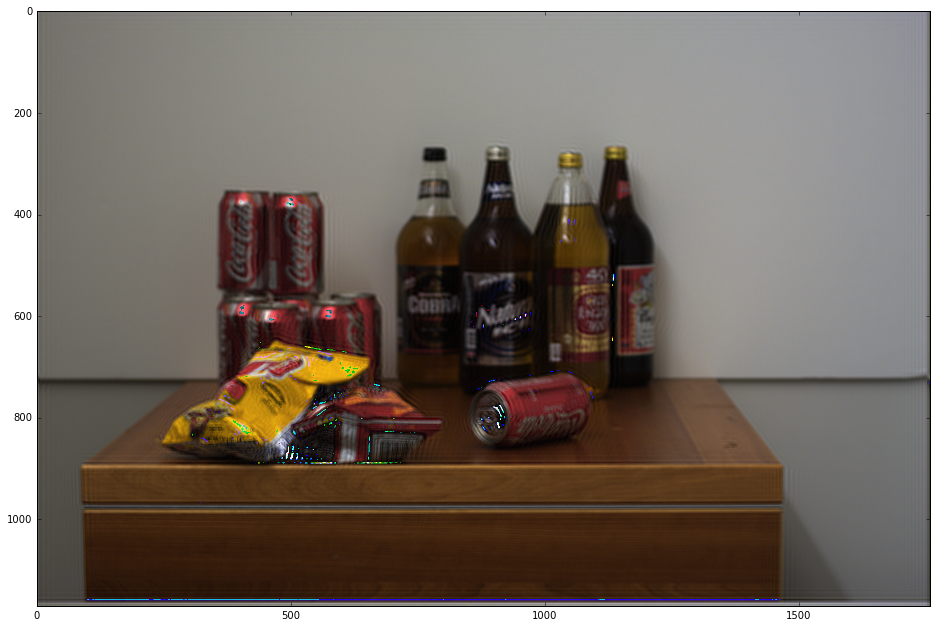

In [151]:
figure(figsize=(16,16))
imshow(a)
print a
print test_image

In [ ]:
from scipy import signal

errors = [sum(test_image - dstack((signal.convolve2d(deconvolved[:,:,0], filter,  boundary='symm', mode='same'),
              signal.convolve2d(deconvolved[:,:,1],filter,  boundary='symm', mode='same'),
              signal.convolve2d(deconvolved[:,:,2],filter,  boundary='symm', mode='same'))), axis=-1)
              for filter, deconvolved in zip(filters[:,3].tolist(), deconvolved_images)]


Finally we choose the smallest error for each pixel over a 3x3 environment

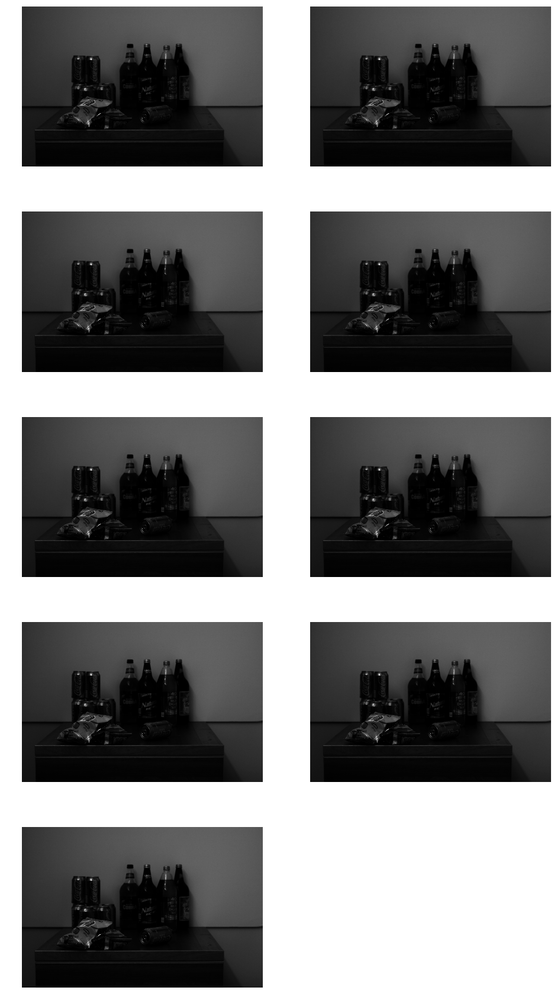

In [148]:
figure(figsize=(16,30))
for i, image in enumerate(errors):
    subplot(5,2,i+1)
    axis('off')
    imshow(image**2)

In [138]:
one_window = ones((1,1))
window = array([[1,2,1],[1,2,1],[1,2,1]])
window2 = array([[1,2,3,2,1],[1,2,3,2,1],[1,2,3,2,1],[1,2,3,2,1],[1,2,3,2,1]])
window3 = ones((20,20))

pixel_errors = array([signal.convolve2d(error_image**2, window3,  boundary='symm', mode='same') for error_image in errors])
d = argmin(pixel_errors, axis=0)

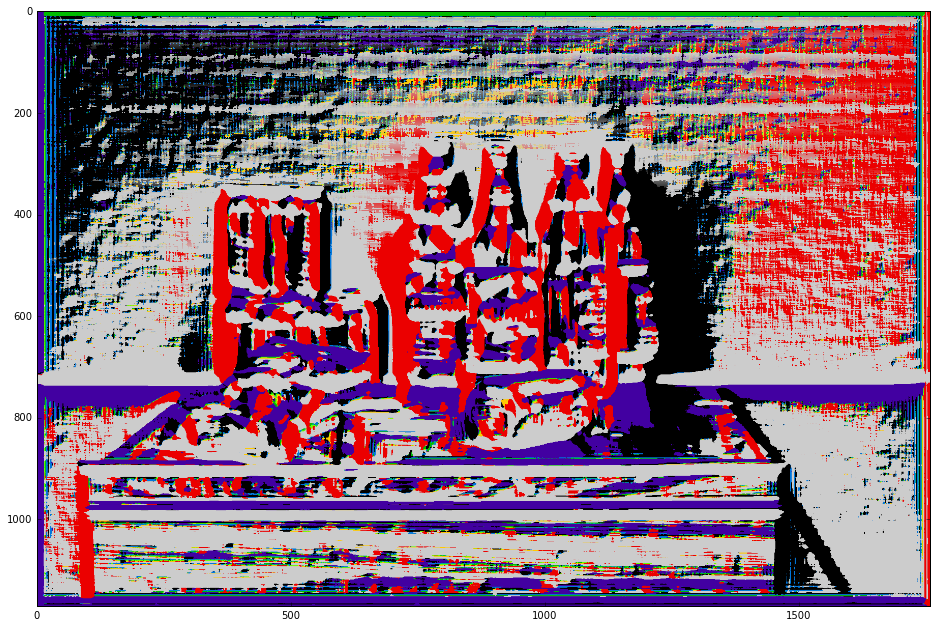

In [139]:
figure(figsize=(16,16))
imshow(d).set_cmap('nipy_spectral')

In [140]:
deblurred = zeros_like(deconvolved_images[0])
for x in range(test_image.shape[0]):
    for y in range(test_image.shape[1]):
        deblurred[x,y] = deconvolved_images[d[x,y]][x,y]

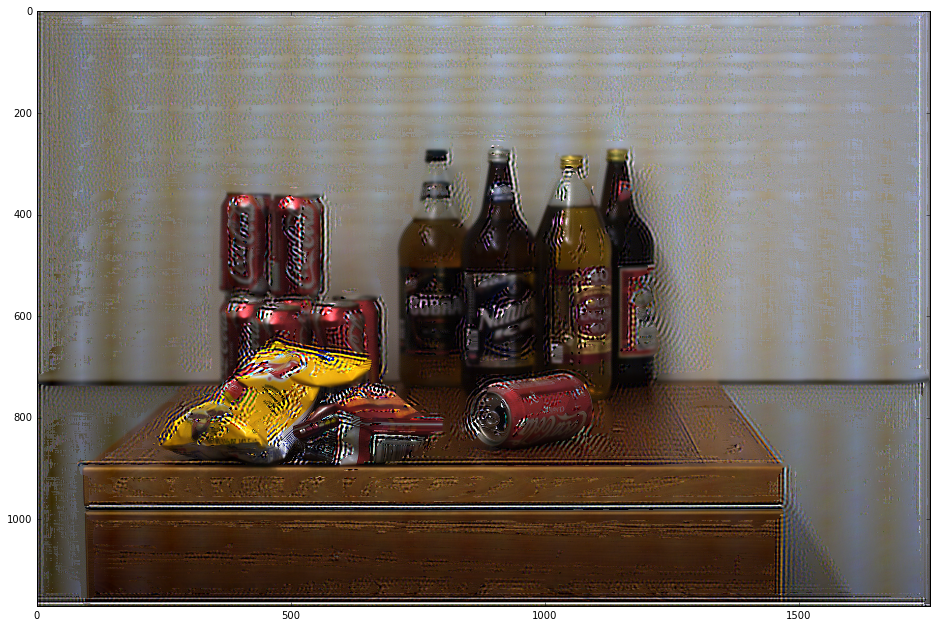

In [141]:
figure(figsize=(16,16))
imshow(clip(deblurred,0,1))

In [144]:
def show_with_kernel(kernel):
    print kernel
    pixel_errors = array([signal.convolve2d(error_image**2, kernel,  boundary='symm', mode='same') for error_image in errors])
    d = argmin(pixel_errors, axis=0)
    figure(figsize=(32,16))
    subplot(2,1,1)
    imshow(d).set_cmap('nipy_spectral')
    deblurred = zeros_like(deconvolved_images[0])
    for x in range(test_image.shape[0]):
        for y in range(test_image.shape[1]):
            deblurred[x,y] = deconvolved_images[d[x,y]][x,y]
    subplot(2,1,2)
    imshow(clip(deblurred,0,1))

[[ 1.]]


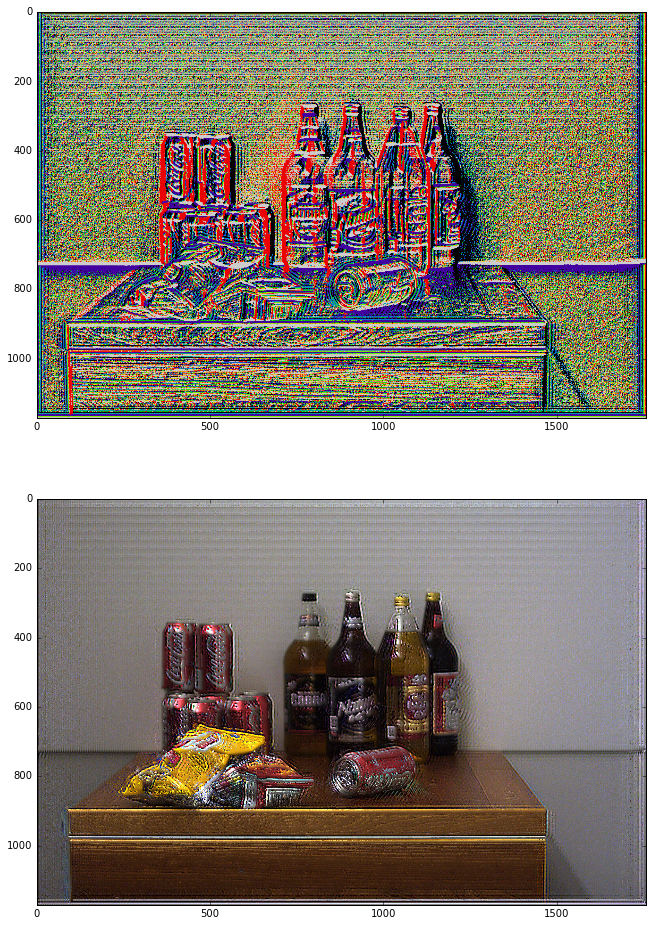

In [145]:
show_with_kernel(one_window)

[[1 2 1]
 [1 2 1]
 [1 2 1]]


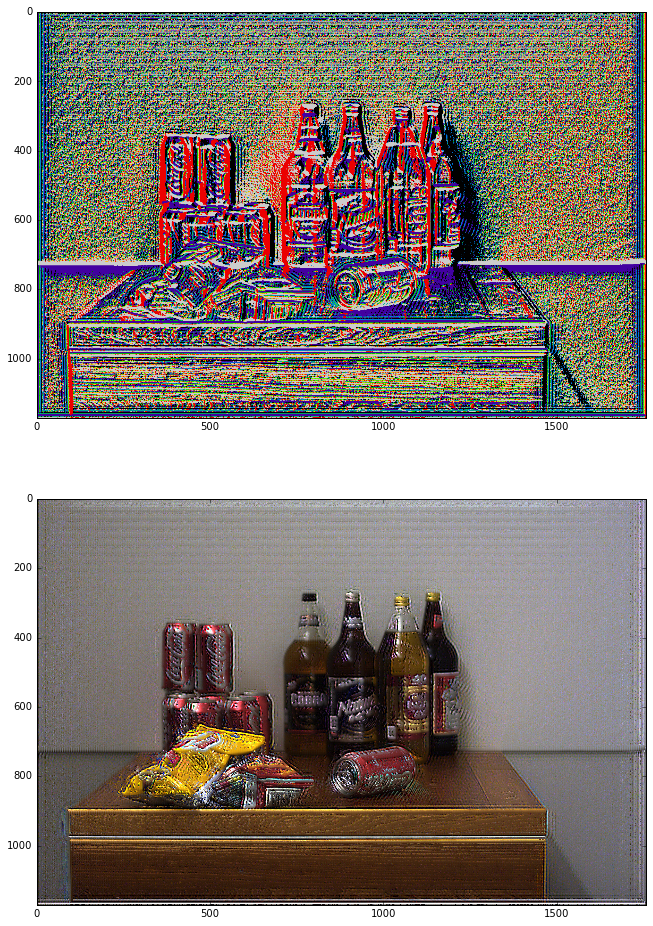

In [146]:
show_with_kernel(window)

[[1 2 3 2 1]
 [1 2 3 2 1]
 [1 2 3 2 1]
 [1 2 3 2 1]
 [1 2 3 2 1]]


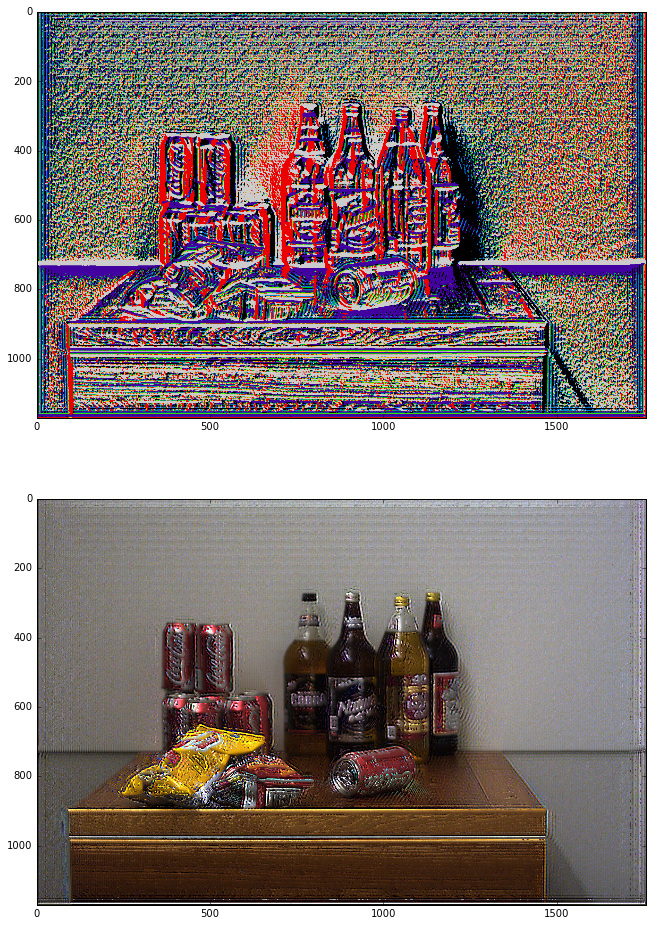

In [147]:
show_with_kernel(window2)